In [1]:
import pandas as pd

# Load GTFS files
routes_df = pd.read_csv("routes.txt")
trips_df = pd.read_csv("trips.txt")
calendar_df = pd.read_csv("calendar.txt")

try:
    calendar_dates_df = pd.read_csv("calendar_dates.txt")
except FileNotFoundError:
    calendar_dates_df = None

# Step 1: Calculate weekly service days for each service_id
# Sum the number of active days (Mon-Sun) for each service_id in calendar.txt
calendar_df['weekly_active_days'] = calendar_df[['monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday']].sum(axis=1)

# Step 2: Merge trips with calendar to link trips to service days
trips_with_service = pd.merge(trips_df, calendar_df[['service_id', 'weekly_active_days']], on='service_id', how='left')

# Step 3: Compute weekly trips per route
# Multiply the number of weekly active days by the number of trips for each route_id
trips_with_service['weekly_trips'] = trips_with_service['weekly_active_days']

# Group by route_id and sum up weekly trips
weekly_trips_per_route = trips_with_service.groupby('route_id')['weekly_trips'].sum().reset_index()

# Step 4: Merge with route details for human-readable output
weekly_trips_summary = pd.merge(weekly_trips_per_route, routes_df, on='route_id', how='left')

# Display result
print(weekly_trips_summary[['route_id', 'route_short_name', 'route_long_name', 'weekly_trips']])

# Save to CSV (optional)
weekly_trips_summary.to_csv("weekly_trips_per_route.csv", index=False)


    route_id route_short_name                  route_long_name  weekly_trips
0          1                1        GARE DE L'OUEST - STOCKEL          2261
1          2                5        ERASME - HERRMANN-DEBROUX          2332
2          3                2              SIMONIS - ELISABETH          2123
3          4                6         ROI BAUDOUIN - ELISABETH          2181
4          5                4        GARE DU NORD - STALLE (P)          2267
..       ...              ...                              ...           ...
86        87              240          CERIA - FOREST NATIONAL            68
87        88               T8               LOUISE - ROODEBEEK          1704
88        89              T44    MONTGOMERY - TERVUREN STATION          1176
89        90              T92      SCHAERBEEK GARE - FORT-JACO          1757
90        91               T9  GROOT-BIJGAARDEN - ROI BAUDOUIN          2694

[91 rows x 4 columns]


In [3]:
#The code for calculating the adjacency matrix
import pandas as pd
import numpy as np

# Load required GTFS files
stops_df = pd.read_csv("stops.txt")
stop_times_df = pd.read_csv("stop_times.txt")

# Step 1: Merge stop_times with trips to associate trips with service days
stop_times_with_trips = pd.merge(stop_times_df, trips_with_service[['trip_id', 'weekly_trips']], on='trip_id', how='left')

# Step 2: Create edges between consecutive stops in stop_times
stop_times_with_trips.sort_values(by=['trip_id', 'stop_sequence'], inplace=True)
stop_times_with_trips['next_stop_id'] = stop_times_with_trips.groupby('trip_id')['stop_id'].shift(-1)

# Drop rows where next_stop_id is NaN (last stop in each trip)
stop_times_with_trips = stop_times_with_trips.dropna(subset=['next_stop_id'])

# Step 3: Sum weights for edges
# Each edge (stop_id -> next_stop_id) will have a weight equal to the sum of weekly trips
edges = stop_times_with_trips.groupby(['stop_id', 'next_stop_id'])['weekly_trips'].sum().reset_index()

# Step 4: Create adjacency matrix
# Create a mapping of stop_id to matrix index
stop_ids = pd.concat([edges['stop_id'], edges['next_stop_id']]).unique()
stop_id_to_index = {stop_id: i for i, stop_id in enumerate(stop_ids)}

# Initialize adjacency matrix
adj_matrix = np.zeros((len(stop_ids), len(stop_ids)))

# Populate adjacency matrix with weights
for _, row in edges.iterrows():
    i = stop_id_to_index[row['stop_id']]
    j = stop_id_to_index[row['next_stop_id']]
    adj_matrix[i, j] = row['weekly_trips']

# Convert to DataFrame for easier interpretation (optional)
adj_matrix_df = pd.DataFrame(adj_matrix, index=stop_ids, columns=stop_ids)

# Save adjacency matrix to a file (optional)
adj_matrix_df.to_csv("adjacency_matrix.csv")

# Print adjacency matrix
print(adj_matrix_df)


      0089  0472    0501  0506  0511    0516  0521  0526  0529  0531  ...  \
0089   0.0   0.0     0.0   0.0   0.0     0.0   0.0   0.0   0.0   0.0  ...   
0472   0.0   0.0     0.0   0.0   0.0     0.0   0.0   0.0   0.0   0.0  ...   
0501   0.0   0.0     0.0   0.0   0.0     0.0   0.0   0.0   0.0   0.0  ...   
0506   0.0   0.0     0.0   0.0   0.0  2016.0   0.0   0.0   0.0   0.0  ...   
0511   0.0   0.0  2029.0   0.0   0.0     0.0   0.0   0.0   0.0   0.0  ...   
...    ...   ...     ...   ...   ...     ...   ...   ...   ...   ...  ...   
5320   0.0   0.0     0.0   0.0   0.0     0.0   0.0   0.0   0.0   0.0  ...   
4265   0.0   0.0     0.0   0.0   0.0     0.0   0.0   0.0   0.0   0.0  ...   
1390   0.0   0.0     0.0   0.0   0.0     0.0   0.0   0.0   0.0   0.0  ...   
7305   0.0   0.0     0.0   0.0   0.0     0.0   0.0   0.0   0.0   0.0  ...   
8472   0.0   0.0     0.0   0.0   0.0     0.0   0.0   0.0   0.0   0.0  ...   

      5776  6486G  0712F  4502F  9952G  5320  4265  1390  7305  8472  
0089

In [5]:
import pandas as pd
import numpy as np
import networkx as nx

# Load adjacency matrix
adj_matrix_df = pd.read_csv("adjacency_matrix.csv", index_col=0)

# Convert adjacency matrix to a numpy array
adj_matrix = adj_matrix_df.values

# Create a directed graph from the adjacency matrix
G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)

# Relabel nodes with stop IDs for clarity (optional)
mapping = {i: stop_id for i, stop_id in enumerate(adj_matrix_df.index)}
G = nx.relabel_nodes(G, mapping)

# Calculate eigenvector centrality
eigenvector_centrality = nx.eigenvector_centrality_numpy(G, weight='weight')

# Convert results to a DataFrame for easier interpretation
eigenvector_centrality_df = pd.DataFrame(
    list(eigenvector_centrality.items()), 
    columns=['stop_id', 'eigenvector_centrality']
)

# Sort by centrality (descending order)
eigenvector_centrality_df = eigenvector_centrality_df.sort_values(by='eigenvector_centrality', ascending=False)

# Save to CSV (optional)
eigenvector_centrality_df.to_csv("eigenvector_centrality.csv", index=False)

# Print the top stops by eigenvector centrality
print(eigenvector_centrality_df.head())


     stop_id  eigenvector_centrality
1103    2928                0.250939
1901    5611                0.239206
1315    3372                0.226240
1374    3517                0.213970
1370   3510B                0.202366


In [7]:
print(eigenvector_centrality_df)

     stop_id  eigenvector_centrality
1103    2928            2.509385e-01
1901    5611            2.392063e-01
1315    3372            2.262403e-01
1374    3517            2.139702e-01
1370   3510B            2.023655e-01
...      ...                     ...
415    1674F           -2.839838e-16
422    1681F           -2.885439e-16
420    1679F           -2.904420e-16
418    1677F           -2.953704e-16
2216   6865F           -2.964927e-16

[2489 rows x 2 columns]


In [11]:
!pip install folium

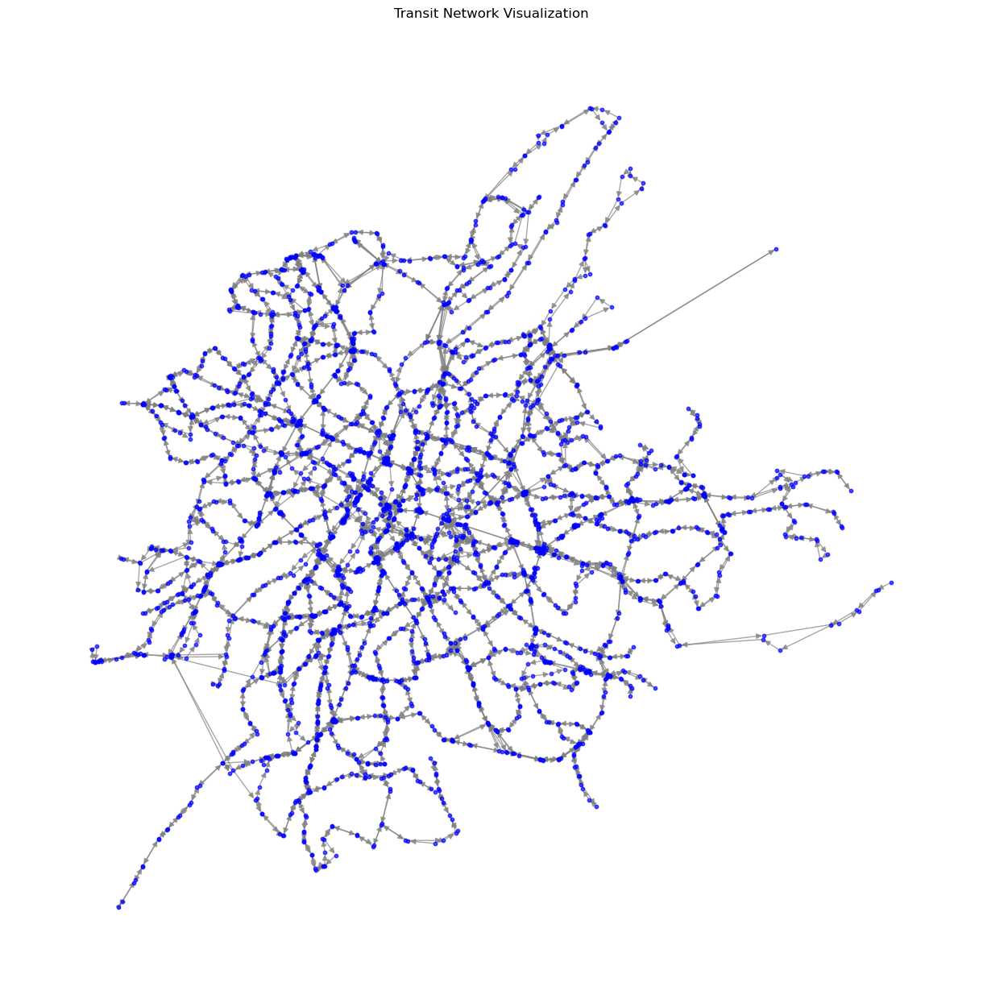

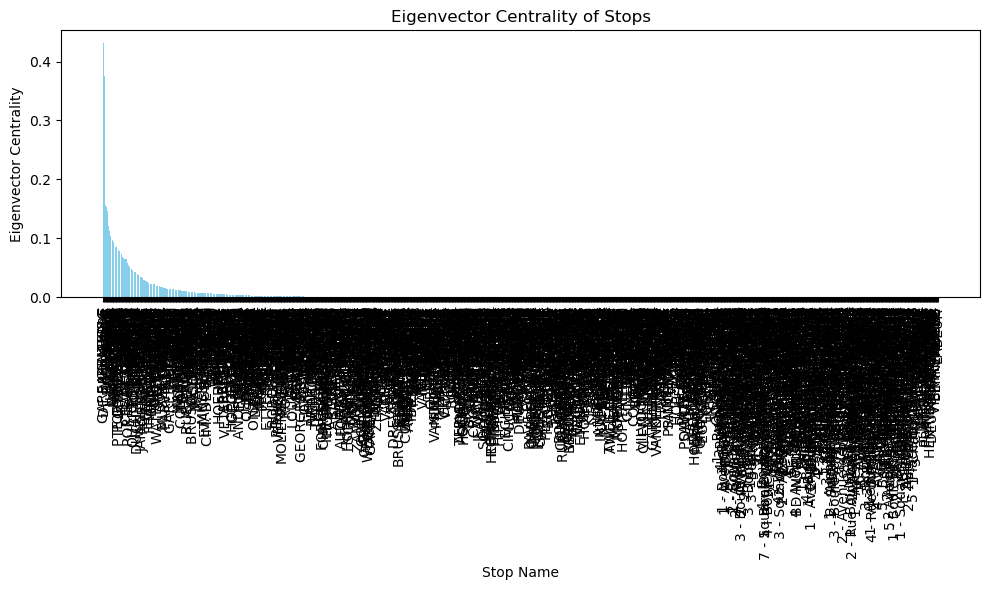

In [17]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from IPython.display import display
import folium

# Load the necessary GTFS files
stops_df = pd.read_csv("stops.txt")
stop_times_df = pd.read_csv("stop_times.txt")
trips_df = pd.read_csv("trips.txt")

# Merge stop_times with stops to get stop details
stop_times_with_stops = stop_times_df.merge(stops_df, on="stop_id")

# Build the graph
G = nx.DiGraph()

# Add nodes (stops)
for _, stop in stops_df.iterrows():
    G.add_node(
        stop["stop_id"],
        name=stop["stop_name"],
        lat=stop["stop_lat"],
        lon=stop["stop_lon"],
    )

# Add edges (connections based on stop sequence)
for trip_id, trip_data in stop_times_with_stops.groupby("trip_id"):
    trip_data = trip_data.sort_values("stop_sequence")
    for i in range(len(trip_data) - 1):
        stop_a = trip_data.iloc[i]
        stop_b = trip_data.iloc[i + 1]
        G.add_edge(
            stop_a["stop_id"],
            stop_b["stop_id"],
            trip_id=trip_id,
        )

# Calculate eigenvector centrality
eigenvector_centrality = nx.eigenvector_centrality_numpy(G, weight=None)

# Convert results to DataFrame
eigenvector_centrality_df = pd.DataFrame(
    eigenvector_centrality.items(), columns=["stop_id", "eigenvector_centrality"]
)

# Merge centrality values with stops data
stops_with_centrality = stops_df.merge(eigenvector_centrality_df, on="stop_id")

# Sort by centrality for analysis
stops_with_centrality = stops_with_centrality.sort_values(
    by="eigenvector_centrality", ascending=False
)

# Visualize the graph
plt.figure(figsize=(12, 12))
pos = {node: (data["lon"], data["lat"]) for node, data in G.nodes(data=True)}
nx.draw(
    G,
    pos,
    node_size=10,
    node_color="blue",
    edge_color="gray",
    with_labels=False,
    alpha=0.7,
)
plt.title("Transit Network Visualization")
plt.show()

# Visualize eigenvector centrality as a bar plot
plt.figure(figsize=(10, 6))
plt.bar(
    stops_with_centrality["stop_name"],
    stops_with_centrality["eigenvector_centrality"],
    color="skyblue",
)
plt.xticks(rotation=90)
plt.xlabel("Stop Name")
plt.ylabel("Eigenvector Centrality")
plt.title("Eigenvector Centrality of Stops")
plt.tight_layout()
plt.show()

# Create a Folium map
map_center = [
    stops_with_centrality["stop_lat"].mean(),
    stops_with_centrality["stop_lon"].mean(),
]
mymap = folium.Map(location=map_center, zoom_start=12)

# Add stops to the map with size proportional to centrality
for _, row in stops_with_centrality.iterrows():
    folium.CircleMarker(
        location=(row["stop_lat"], row["stop_lon"]),
        radius=10 * row["eigenvector_centrality"],  # Scale radius by centrality
        color="blue",
        fill=True,
        fill_opacity=0.7,
        fill_color="red",
        popup=f"Stop Name: {row['stop_name']}<br>Centrality: {row['eigenvector_centrality']:.4f}",
    ).add_to(mymap)

# Display the map in the notebook
display(mymap)


In [21]:
# Print all eigenvector centrality values using a for loop
print("Eigenvector Centrality Values:")
for _, row in stops_with_centrality.iterrows():
    print(f"Stop ID: {row['stop_id']}, Stop Name: {row['stop_name']}, Centrality: {row['eigenvector_centrality']:.6f}")


Eigenvector Centrality Values:
Stop ID: 2301, Stop Name: ARENBERG, Centrality: 0.431447
Stop ID: 1000, Stop Name: GARE CENTRALE, Centrality: 0.376313
Stop ID: 2788, Stop Name: GARE CENTRALE, Centrality: 0.269006
Stop ID: 2595, Stop Name: DE BROUCKERE, Centrality: 0.251380
Stop ID: 1001, Stop Name: GARE CENTRALE, Centrality: 0.188629
Stop ID: 2739, Stop Name: MADELEINE, Centrality: 0.156734
Stop ID: 3503, Stop Name: ROYALE, Centrality: 0.152606
Stop ID: 1895, Stop Name: BOURSE, Centrality: 0.146513
Stop ID: 3465, Stop Name: DE BROUCKERE, Centrality: 0.146467
Stop ID: 2596, Stop Name: DE BROUCKERE, Centrality: 0.146465
Stop ID: 1003, Stop Name: GARE CENTRALE, Centrality: 0.138742
Stop ID: 1005, Stop Name: GARE CENTRALE, Centrality: 0.130558
Stop ID: 1167, Stop Name: CHAPELLE, Centrality: 0.125904
Stop ID: 6444, Stop Name: GARE CENTRALE, Centrality: 0.125790
Stop ID: 3072, Stop Name: ROSA PARKS, Centrality: 0.120390
Stop ID: 6433, Stop Name: TRONE, Centrality: 0.112225
Stop ID: 1734, Stop

In [23]:
# Create a Folium map
map_center = [
    stops_with_centrality["stop_lat"].mean(),
    stops_with_centrality["stop_lon"].mean(),
]
mymap = folium.Map(location=map_center, zoom_start=12)

# Normalize eigenvector centrality for better visualization scaling
max_centrality = stops_with_centrality["eigenvector_centrality"].max()
stops_with_centrality["normalized_centrality"] = (
    stops_with_centrality["eigenvector_centrality"] / max_centrality
)

# Add stops to the map with size proportional to normalized centrality
for _, row in stops_with_centrality.iterrows():
    folium.CircleMarker(
        location=(row["stop_lat"], row["stop_lon"]),
        radius=15 * row["normalized_centrality"],  # Scale radius
        color="blue",
        fill=True,
        fill_opacity=0.7,
        fill_color="red",
        popup=(
            f"<b>Stop Name:</b> {row['stop_name']}<br>"
            f"<b>Centrality:</b> {row['eigenvector_centrality']:.4f}"
        ),
    ).add_to(mymap)

# Display the map in the notebook
display(mymap)


In [7]:
#Local clustering coefficient

def local_clustering_coefficient(adj_matrix):
    """
    Compute the local clustering coefficient for each node in a graph.
    
    Parameters:
    adj_matrix (np.array): Adjacency matrix of the graph.
    
    Returns:
    dict: A dictionary mapping each node index to its clustering coefficient.
    """
    n = adj_matrix.shape[0]  # Number of nodes
    clustering_coefficients = {}
    
    for node in range(n):
        # Get neighbors of the current node
        neighbors = np.where(adj_matrix[node] > 0)[0]
        k = len(neighbors)  # Degree of the node
        
        if k < 2:  # Clustering coefficient is 0 if fewer than 2 neighbors
            clustering_coefficients[node] = 0.0
            continue
        
        # Count actual edges between neighbors
        actual_edges = 0
        for i, neighbor1 in enumerate(neighbors):
            for neighbor2 in neighbors[i + 1:]:
                if adj_matrix[neighbor1, neighbor2] > 0 or adj_matrix[neighbor2, neighbor1] > 0:
                    actual_edges += 1
        
        # Number of possible edges between neighbors
        possible_edges = k * (k - 1) / 2
        
        # Clustering coefficient for the node
        clustering_coefficients[node] = actual_edges / possible_edges
    
    return clustering_coefficients


# Call the function on the adjacency matrix
clustering_coeffs = local_clustering_coefficient(adj_matrix)

# Print results
for node, coeff in clustering_coeffs.items():
    print(f"Node {node}: Clustering Coefficient = {coeff:.3f}")


Node 0: Clustering Coefficient = 0.000
Node 1: Clustering Coefficient = 0.000
Node 2: Clustering Coefficient = 0.000
Node 3: Clustering Coefficient = 0.000
Node 4: Clustering Coefficient = 0.000
Node 5: Clustering Coefficient = 0.000
Node 6: Clustering Coefficient = 0.000
Node 7: Clustering Coefficient = 0.000
Node 8: Clustering Coefficient = 0.000
Node 9: Clustering Coefficient = 0.000
Node 10: Clustering Coefficient = 0.000
Node 11: Clustering Coefficient = 0.000
Node 12: Clustering Coefficient = 0.000
Node 13: Clustering Coefficient = 0.000
Node 14: Clustering Coefficient = 0.000
Node 15: Clustering Coefficient = 0.000
Node 16: Clustering Coefficient = 0.000
Node 17: Clustering Coefficient = 0.000
Node 18: Clustering Coefficient = 0.000
Node 19: Clustering Coefficient = 0.000
Node 20: Clustering Coefficient = 0.000
Node 21: Clustering Coefficient = 0.000
Node 22: Clustering Coefficient = 0.000
Node 23: Clustering Coefficient = 0.000
Node 24: Clustering Coefficient = 0.000
Node 25: C

In [11]:
import pandas as pd
import numpy as np
import networkx as nx

# Load required GTFS files
stops_df = pd.read_csv("stops.txt")
stop_times_df = pd.read_csv("stop_times.txt")

# Step 1: Merge stop_times with trips to associate trips with service days
stop_times_with_trips = pd.merge(stop_times_df, trips_with_service[['trip_id', 'weekly_trips']], on='trip_id', how='left')

# Step 2: Create edges between consecutive stops in stop_times
stop_times_with_trips.sort_values(by=['trip_id', 'stop_sequence'], inplace=True)
stop_times_with_trips['next_stop_id'] = stop_times_with_trips.groupby('trip_id')['stop_id'].shift(-1)

# Drop rows where next_stop_id is NaN (last stop in each trip)
stop_times_with_trips = stop_times_with_trips.dropna(subset=['next_stop_id'])

# Step 3: Sum weights for edges
# Each edge (stop_id -> next_stop_id) will have a weight equal to the sum of weekly trips
edges = stop_times_with_trips.groupby(['stop_id', 'next_stop_id'])['weekly_trips'].sum().reset_index()

# Step 4: Create a NetworkX graph from edges
G = nx.DiGraph()  # Use nx.Graph() for undirected graph if required

# Add edges with weights
for _, row in edges.iterrows():
    G.add_edge(row['stop_id'], row['next_stop_id'], weight=row['weekly_trips'])

# Compute local clustering coefficients
clustering_coeffs = nx.clustering(G, weight=None)  # Use weight='weight' for weighted clustering

# Print clustering coefficients
for node, coeff in clustering_coeffs.items():
    print(f"Node {node}: Clustering Coefficient = {coeff}")


Node 0089: Clustering Coefficient = 0
Node 5501: Clustering Coefficient = 0
Node 0472: Clustering Coefficient = 0
Node 5165: Clustering Coefficient = 0
Node 0501: Clustering Coefficient = 0
Node 0601: Clustering Coefficient = 0
Node 0506: Clustering Coefficient = 0
Node 0516: Clustering Coefficient = 0
Node 0511: Clustering Coefficient = 0
Node 0526: Clustering Coefficient = 0
Node 0521: Clustering Coefficient = 0
Node 0529: Clustering Coefficient = 0
Node 0539: Clustering Coefficient = 0
Node 6177F: Clustering Coefficient = 0
Node 0536: Clustering Coefficient = 0
Node 0531: Clustering Coefficient = 0
Node 5762: Clustering Coefficient = 0
Node 0611: Clustering Coefficient = 0
Node 0606: Clustering Coefficient = 0
Node 0621: Clustering Coefficient = 0
Node 0616: Clustering Coefficient = 0
Node 0702: Clustering Coefficient = 0
Node 0626: Clustering Coefficient = 0
Node 0631: Clustering Coefficient = 0
Node 2539F: Clustering Coefficient = 0
Node 0636: Clustering Coefficient = 0
Node 6068:

In [27]:
import pandas as pd
import numpy as np
import networkx as nx
import folium
from folium.plugins import MarkerCluster
from IPython.display import display, IFrame

# Load required GTFS files
stops_df = pd.read_csv("stops.txt")
stop_times_df = pd.read_csv("stop_times.txt")
trips_df = pd.read_csv("trips.txt")
calendar_df = pd.read_csv("calendar.txt")  # Contains service_id and day-of-week info

# Step 1: Calculate weekly trips
# Sum active days of service (monday to sunday) for each service_id
calendar_df['weekly_trips'] = calendar_df[['monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday']].sum(axis=1)

# Merge weekly trip counts into trips DataFrame
trips_with_service = pd.merge(trips_df, calendar_df[['service_id', 'weekly_trips']], on='service_id', how='left')

# Step 2: Merge stop_times with trips to associate trips with weekly trips
stop_times_with_trips = pd.merge(stop_times_df, trips_with_service[['trip_id', 'weekly_trips']], on='trip_id', how='left')

# Step 3: Create edges between consecutive stops in stop_times
stop_times_with_trips.sort_values(by=['trip_id', 'stop_sequence'], inplace=True)
stop_times_with_trips['next_stop_id'] = stop_times_with_trips.groupby('trip_id')['stop_id'].shift(-1)

# Drop rows where next_stop_id is NaN (last stop in each trip)
stop_times_with_trips = stop_times_with_trips.dropna(subset=['next_stop_id'])

# Step 4: Sum weights for edges
edges = stop_times_with_trips.groupby(['stop_id', 'next_stop_id'])['weekly_trips'].sum().reset_index()

# Step 5: Create a NetworkX graph from edges
G = nx.DiGraph()  # Use nx.Graph() for undirected graph if required

# Add edges with weights
for _, row in edges.iterrows():
    G.add_edge(row['stop_id'], row['next_stop_id'], weight=row['weekly_trips'])

# Compute local clustering coefficients
clustering_coeffs = nx.clustering(G, weight=None)  # Use weight='weight' for weighted clustering

# Add clustering coefficients to the stops DataFrame
stops_df['clustering_coeff'] = stops_df['stop_id'].map(clustering_coeffs)

# Step 6: Map drawing
# Initialize a folium map centered on Brussels
brussels_map = folium.Map(location=[50.8503, 4.3517], zoom_start=12)

# Create a color scale based on clustering coefficient values
def get_color(coeff):
    if pd.isna(coeff):
        return 'gray'
    elif coeff < 0.2:
        return 'green'
    elif coeff < 0.5:
        return 'yellow'
    else:
        return 'red'

# Add stops as markers
for _, stop in stops_df.iterrows():
    lat = stop['stop_lat']
    lon = stop['stop_lon']
    coeff = stop['clustering_coeff']
    color = get_color(coeff)
    
    popup_info = f"Stop ID: {stop['stop_id']}<br>Clustering Coefficient: {coeff:.2f}" if not pd.isna(coeff) else f"Stop ID: {stop['stop_id']}<br>Clustering Coefficient: N/A"
    folium.CircleMarker(
        location=(lat, lon),
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=popup_info
    ).add_to(brussels_map)

# Save map to HTML
map_filename = "brussels_clustering_map.html"
brussels_map.save(map_filename)

# Display the map in the notebook
display(IFrame(map_filename, width=800, height=600))


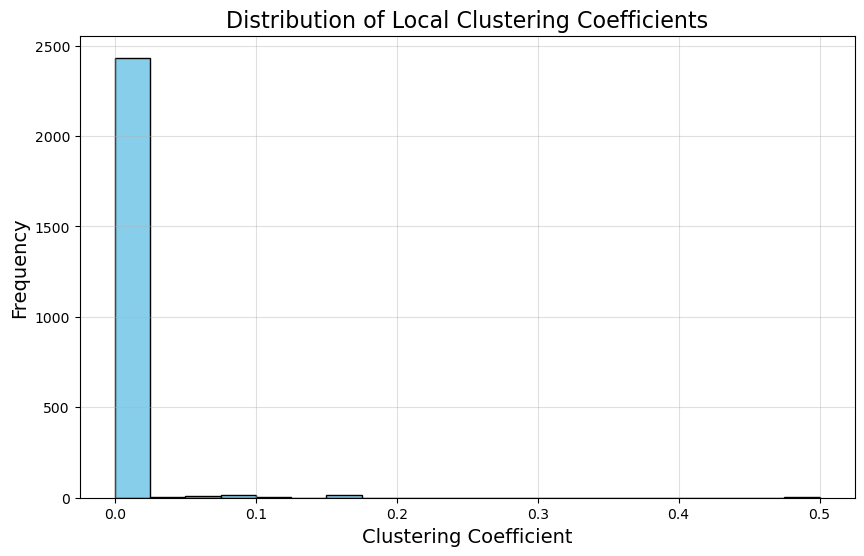

In [29]:
import matplotlib.pyplot as plt

# Filter valid clustering coefficients (remove NaN)
valid_clustering_coeffs = stops_df['clustering_coeff'].dropna()

# Plot a histogram of clustering coefficients
plt.figure(figsize=(10, 6))
plt.hist(valid_clustering_coeffs, bins=20, color='skyblue', edgecolor='black')
plt.title("Distribution of Local Clustering Coefficients", fontsize=16)
plt.xlabel("Clustering Coefficient", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(alpha=0.4)
plt.show()


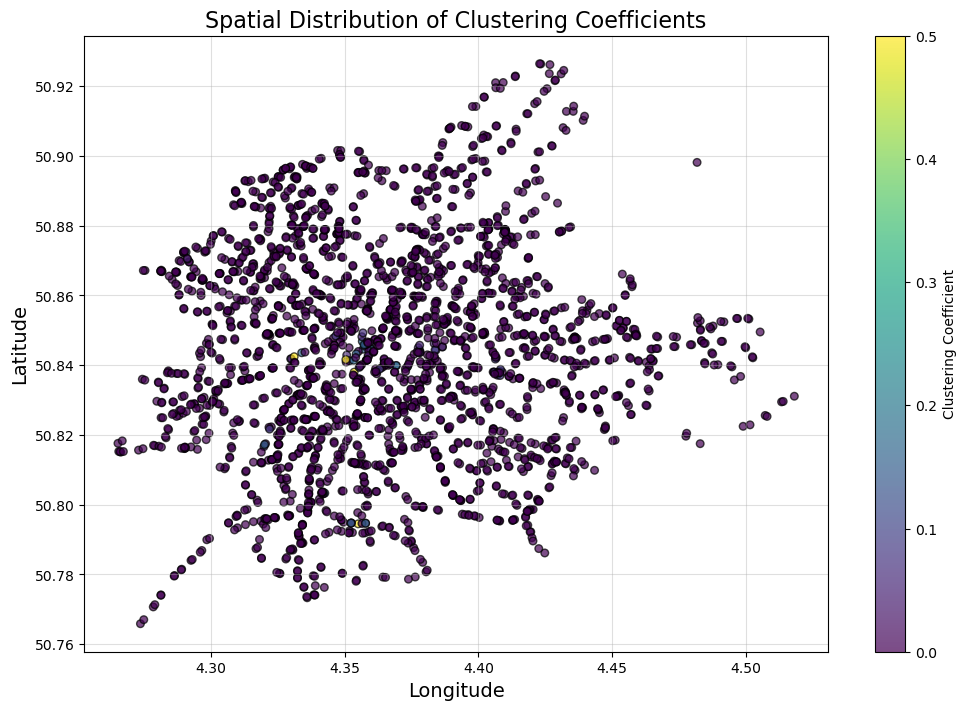

In [31]:
# Scatter plot of stop locations with clustering coefficient as color
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    stops_df['stop_lon'], 
    stops_df['stop_lat'], 
    c=stops_df['clustering_coeff'], 
    cmap='viridis', 
    s=30, 
    alpha=0.7, 
    edgecolor='k'
)
plt.colorbar(scatter, label="Clustering Coefficient")
plt.title("Spatial Distribution of Clustering Coefficients", fontsize=16)
plt.xlabel("Longitude", fontsize=14)
plt.ylabel("Latitude", fontsize=14)
plt.grid(alpha=0.4)
plt.show()
